### Crash Stats - Data Extract - VicRoads CrashStats database

The data provided allows users to analyse Victorian fatal and injury crash data based on time, location, conditions, crash type, road user type, object hit etc.


Tables

- accident (basic accident details, time, severity, location)

- person (person based details, age, sex etc)

- vehicle (vehicle based data, vehicle type, make etc)

- accident_event (sequence of events e.g. left road, rollover, caught fire)

- road_surface_cond (whether road was wet, dry, icy etc)

- atmospheric_cond (rain, winds etc)

- sub_dca (detailed codes describing accident)

- accident_node (master location table - NB subset of accident table)

- Node Table with Lat/Long references

Further explanation about the fields can be found at the link below:

https://data.vicroads.vic.gov.au/Metadata/Crash%20Stats%20-%20Data%20Extract%20-%20Open%20Data.html

In [46]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import itertools

from pandas_profiling import ProfileReport


from simple_colors import *
pd.set_option('display.max_columns', None) # Unlimited.

import warnings
warnings.filterwarnings("ignore")

import sys
import sklearn.neighbors._base 
sys.modules['sklearn.neighbors.base'] = sklearn.neighbors._base



import sqlite3

import json
import folium

RANDOM_STATE = 42

_Set a colour palet and theme that will apply all the plot unless different settings are specified._

In [206]:
PALETTE = 'ch:s=.35,rot=-.35'
sns.set_theme(
    font_scale=1,
    font='arial',
    palette=sns.set_palette(sns.color_palette(PALETTE, as_cmap=False)),
    rc={'figure.figsize':(20,10)},
    )

In [3]:
%load_ext watermark
%watermark --iversions
!python --version

sklearn   : 1.0.2
folium    : 0.12.1.post1
json      : 2.0.9
pandas    : 1.4.2
seaborn   : 0.11.2
sqlite3   : 2.6.0
sys       : 3.9.12 (main, Apr  5 2022, 01:53:17) 
[Clang 12.0.0 ]
numpy     : 1.21.5
matplotlib: 3.5.1

Python 3.9.12


In [4]:
#1
data_ACCIDENT = pd.read_csv('data/2000_to_2005_ACCIDENT/ACCIDENT.csv')
#2
data_ACCIDENT_CHAINAGE = pd.read_csv('data/2000_to_2005_ACCIDENT/ACCIDENT_CHAINAGE.csv')
#3
data_ACCIDENT_EVENT = pd.read_csv('data/2000_to_2005_ACCIDENT/ACCIDENT_EVENT.csv')
#4
data_ACCIDENT_LOCATION = pd.read_csv('data/2000_to_2005_ACCIDENT/ACCIDENT_LOCATION.csv')
#5
data_ATMOSPHERIC_COND = pd.read_csv('data/2000_to_2005_ACCIDENT/ATMOSPHERIC_COND.csv')
#6
data_NODE = pd.read_csv('data/2000_to_2005_ACCIDENT/NODE.csv')
#7
data_NODE_ID_COMPLEX_INT_ID = pd.read_csv('data/2000_to_2005_ACCIDENT/NODE_ID_COMPLEX_INT_ID.csv')
#8
data_PERSON = pd.read_csv('data/2000_to_2005_ACCIDENT/PERSON.csv')
#9
data_ROAD_SURFACE_COND = pd.read_csv('data/2000_to_2005_ACCIDENT/ROAD_SURFACE_COND.csv')
#10
data_SUBDCA = pd.read_csv('data/2000_to_2005_ACCIDENT/SUBDCA.csv')
#11
data_Statistic_Checks = pd.read_csv('data/2000_to_2005_ACCIDENT/Statistic_Checks.csv')
#12
data_VEHICLE = pd.read_csv('data/2000_to_2005_ACCIDENT/VEHICLE.csv')


In [5]:
data_frames = {'ACCIDENT'                    : data_ACCIDENT, 
               'ACCIDENT_CHAINAGE'           : data_ACCIDENT_CHAINAGE, 
               'ACCIDENT_EVENT'              : data_ACCIDENT_EVENT, 
               'ACCIDENT_LOCATION'           : data_ACCIDENT_LOCATION,
               'ATMOSPHERIC_COND'            : data_ATMOSPHERIC_COND,
               'NODE'                        : data_NODE,
               'NODE_ID_COMPLEX_INT_ID'      : data_NODE_ID_COMPLEX_INT_ID,
               'PERSON'                      : data_PERSON,
               'ROAD_SURFACE_COND'           : data_ROAD_SURFACE_COND,
               'SUBDCA'                      : data_SUBDCA,
               'Statistic_Checks'            : data_Statistic_Checks,
               'VEHICLE'                     : data_VEHICLE}

_Display all the tables heads_

In [31]:
n = 5
for key, value in data_frames.items():
    
    print(blue(f'\n\n The {key} data frame is: \n', 'underlined'))

    display(value.head(n))



 The ACCIDENT data frame is: 



,accident_no,accidentdate,accidenttime,accident_type,accident_type_desc,day_of_week,day_week_description,dca_code,dca_description,directory,edition,page,grid_reference_x,grid_reference_y,light_condition,light_condition_desc,node_id,no_of_vehicles,no_persons,no_persons_inj_2,no_persons_inj_3,no_persons_killed,no_persons_not_inj,police_attend,road_geometry,road_geometry_desc,severity,speed_zone
0,12000000389,4/01/2000,22.30.00,4,Collision with a fixed object,3,Tuesday,171,LEFT OFF CARRIAGEWAY INTO OBJECT/PARKED VEHICL...,MEL,40.0,88,H,11.0,5,Dark No street lights,25264,1,2,1,0,1,0,1,5,Not at intersection,1,90
1,12000000554,6/01/2000,22.15.00,4,Collision with a fixed object,5,Thursday,171,LEFT OFF CARRIAGEWAY INTO OBJECT/PARKED VEHICL...,MEL,40.0,87,C,1.0,3,Dark Street lights on,42800,1,1,1,0,0,0,1,2,T intersection,2,60
2,12000000555,1/01/2000,18.00.00,1,Collision with vehicle,7,Saturday,130,REAR END(VEHICLES IN SAME LANE),MEL,40.0,2P,C,6.0,1,Day,40101,4,4,1,1,0,2,1,2,T intersection,2,60
3,12000000559,2/01/2000,01.00.00,4,Collision with a fixed object,1,Sunday,181,OFF RIGHT BEND INTO OBJECT/PARKED VEHICLE ...,MEL,40.0,76,F,7.0,3,Dark Street lights on,127638,1,2,2,0,0,0,1,5,Not at intersection,2,60
4,12000000586,3/01/2000,23.50.00,1,Collision with vehicle,2,Monday,110,CROSS TRAFFIC(INTERSECTIONS ONLY),MEL,40.0,69,A,3.0,3,Dark Street lights on,57539,3,3,0,2,0,1,1,1,Cross intersection,3,70




 The ACCIDENT_CHAINAGE data frame is: 



,node_id,route_no,chainage_seq,route_link_no,chainage
0,2,169750,1,169750801,0
1,2,178123,2,178123801,5415
2,3,5820,1,58208002,2095
3,3,159081,2,159081801,994
4,5,5910,1,59108002,2655




 The ACCIDENT_EVENT data frame is: 



,accident_no,event_seq_no,event_type,event_type_desc,vehicle_1_id,vehicle_1_coll_pt,vehicle_1_coll_pt_desc,vehicle_2_id,vehicle_2_coll_pt,vehicle_2_coll_pt_desc,person_id,object_type,object_type_desc
0,12000000389,1.0,3,Ran off carriageway,A,9,Not known or Not Applicable,,,,,99.0,Not Applicable
1,12000000389,2.0,C,Collision,A,F,Front,,,,,1.0,Pole (telphone/electricity)
2,12000000389,3.0,C,Collision,A,1,Right front corner,,,,,10.0,Other Fixed (railway furniture/culvert/telepho...
3,12000000389,4.0,1,Rollover on/off carriageway,A,9,Not known or Not Applicable,,,,,99.0,Not Applicable
4,12000000554,1.0,3,Ran off carriageway,A,9,Not known or Not Applicable,,,,,99.0,Not Applicable




 The ACCIDENT_LOCATION data frame is: 



,accident_no,node_id,road_route_1,road_name,road_type,road_name_int,road_type_int,distance_location,direction_location,nearest_km_post,off_road_location
0,12000000389,25264,2400.0,SPRINGVALE,ROAD,KEYLANA,DRIVE,113.0,N,NaN,NaN
1,12000000554,42800,2070.0,WARRIGAL,ROAD,IRENE,COURT,0.0,S,NaN,NaN
2,12000000555,40101,9999.0,GREY,STREET,ROBE,STREET,0.0,NW,NaN,NaN
3,12000000559,127638,5314.0,HAMPTON,STREET,BEACH,ROAD,34.0,N,NaN,NaN
4,12000000586,57539,2510.0,DANDENONG,ROAD,BELGRAVE,ROAD,0.0,W,NaN,NaN




 The ATMOSPHERIC_COND data frame is: 



,accident_no,atmosph_cond,atmosph_cond_seq,atmosph_cond_desc
0,12000000389,7,1,Strong winds
1,12000000554,1,1,Clear
2,12000000555,1,1,Clear
3,12000000559,1,1,Clear
4,12000000586,1,1,Clear




 The NODE data frame is: 



,accident_no,node_id,node_type,amg_x,amg_y,lga_name,region_name,deg_urban_name,lat,long,postcode_no
0,12000000389,25264,N,2512514.427,2388780.839,DANDENONG,METROPOLITAN SOUTH EAST REGION,Metropolitan Excluding CBD,-38.00211,145.14248,3173
1,12000000554,42800,I,2506548.994,2392856.260,KINGSTON,METROPOLITAN SOUTH EAST REGION,Metropolitan Excluding CBD,-37.96545,145.07453,3192
2,12000000555,40101,I,2498299.136,2404214.048,PORT PHILLIP,METROPOLITAN NORTH WEST REGION,Metropolitan Excluding CBD,-37.86314,144.98067,3182
3,12000000559,127638,N,2500115.047,2395234.944,BAYSIDE,METROPOLITAN SOUTH EAST REGION,Metropolitan Excluding CBD,-37.94404,145.00131,3188
4,12000000586,57539,I,2505935.803,2401836.040,STONNINGTON,METROPOLITAN SOUTH EAST REGION,Metropolitan Excluding CBD,-37.88455,145.06748,3145




 The NODE_ID_COMPLEX_INT_ID data frame is: 



,accident_no,node_id,complex_int_no
0,12000000586,57539,5760
1,12000001526,45858,100369
2,12000001708,37424,9497
3,12000001947,41444,5924
4,12000002238,40357,106095




 The PERSON data frame is: 



,accident_no,person_id,vehicle_id,sex,age,age_group,inj_level,inj_level_desc,seating_position,helmet_belt_worn,road_user_type,road_user_type_desc,licence_state,pedest_movement,postcode,taken_hospital,ejected_code
0,12000000389,01,A,M,16.0,16-17,2,Serious injury,LF,1,3,Passengers,,0,NaN,Y,0
1,12000000389,A,A,M,19.0,17-21,1,Fatality,D,9,2,Drivers,V,0,3169.0,,0
2,12000000554,A,A,M,31.0,30-39,2,Serious injury,D,1,2,Drivers,V,0,NaN,Y,0
3,12000000555,A,A,M,27.0,26-29,2,Serious injury,D,1,2,Drivers,V,0,3039.0,Y,0
4,12000000555,B,B,F,32.0,30-39,3,Other injury,D,1,2,Drivers,V,0,3143.0,N,0




 The ROAD_SURFACE_COND data frame is: 



,accident_no,surface_cond,surface_cond_desc,surface_cond_seq
0,12000000389,9,Unknown,1
1,12000000554,1,Dry,1
2,12000000555,1,Dry,1
3,12000000559,1,Dry,1
4,12000000586,1,Dry,1




 The SUBDCA data frame is: 



,accident_no,sub_dca_code,sub_dca_seq,sub_dca_code_desc
0,12000000389,Q01,2,Poles (telephone/electricity)
1,12000000389,Q10,3,Other objects (Telephone/Culvert/RX) Fixed/Not...
2,12000000389,V02,1,Kerb(roadside) mounted/struck
3,12000000554,Q01,2,Poles (telephone/electricity)
4,12000000554,V02,1,Kerb(roadside) mounted/struck




 The Statistic_Checks data frame is: 



,,,,no._of_crashes_by_severity_by_year_as_at,16/12/16
NaN,1,2,3,4,Sum:
"2,000",373,"5,156","12,395",NaN,"17,924"
"2,001",404,"5,331","11,646",NaN,"17,381"
"2,002",361,"5,762","11,352",12,"17,487"
"2,003",294,"5,452","11,199",60,"17,005"




 The VEHICLE data frame is: 



,accident_no,vehicle_id,vehicle_year_manuf,vehicle_dca_code,initial_direction,road_surface_type,road_surface_type_desc,reg_state,vehicle_body_style,vehicle_make,vehicle_model,vehicle_power,vehicle_type,vehicle_type_desc,vehicle_weight,construction_type,fuel_type,no_of_wheels,no_of_cylinders,seating_capacity,tare_weight,total_no_occupants,carry_capacity,cubic_capacity,final_direction,driver_intent,vehicle_movement,trailer_type,vehicle_colour_1,vehicle_colour_2,caught_fire,initial_impact,lamps,level_of_damage,owner_postcode,towed_away_flag,traffic_control,traffic_control_desc
0,12000000389,A,1979.0,1,N,1,Paved,V,SEDAN,HOLDEN,,31.0,1,Car,NaN,R,P,4.0,6.0,5.0,1250.0,2,1250.0,NaN,N,1,18,H,WHI,ZZ,1,F,1,5,3169.0,1,0,No control
1,12000000554,A,1987.0,1,E,1,Paved,V,SEDAN,FORD,,32.0,1,Car,NaN,R,P,4.0,NaN,5.0,1300.0,1,1300.0,NaN,N,3,01,H,MRN,ZZ,2,F,1,4,3192.0,1,0,No control
2,12000000555,A,1991.0,1,SE,1,Paved,V,COUPE,B M W,,17.0,1,Car,NaN,R,P,4.0,NaN,5.0,1100.0,1,1100.0,NaN,SE,1,01,H,WHI,ZZ,2,F,0,5,3039.0,1,4,Ped. lights
3,12000000555,B,1998.0,2,SE,1,Paved,V,SEDAN,AUDI,,16.0,1,Car,NaN,R,P,4.0,4.0,5.0,1050.0,1,1050.0,NaN,SE,1,15,H,BLK,ZZ,2,F,0,5,3182.0,1,4,Ped. lights
4,12000000555,C,1998.0,8,SE,1,Paved,V,SEDAN,HOLDEN,,51.0,1,Car,NaN,R,P,4.0,8.0,5.0,1600.0,1,1600.0,NaN,SE,15,15,H,BLU,ZZ,2,F,0,2,3305.0,2,4,Ped. lights


__________

### Exploratory Data Analysis

### Data Cleaning

__Column names__

Clean the column names:
- replace space with underscore
- lowercase

In [7]:
for df_name, df in data_frames.items():
    df.columns = df.columns.str.replace(' ','_')
    df.columns= df.columns.str.lower()   

__Check the Duplicated Values__

In [8]:
duplicated_total = []
for df_name, df in data_frames.items():
    duplicates = df.duplicated().sum()
    duplicated_total.append(duplicates)
duplicated_total

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 30, 0]

In [9]:
data_Statistic_Checks.duplicated().sum()

30

__Data and Time columns__

In [10]:
data_ACCIDENT["accidenttime"].dtype

dtype('O')

In [11]:
data_ACCIDENT["accidentdate"].dtype

dtype('O')

__Missing Values__

Let's check all the tables and see the missing values.

The ACCIDENT table's missing value plot is: 



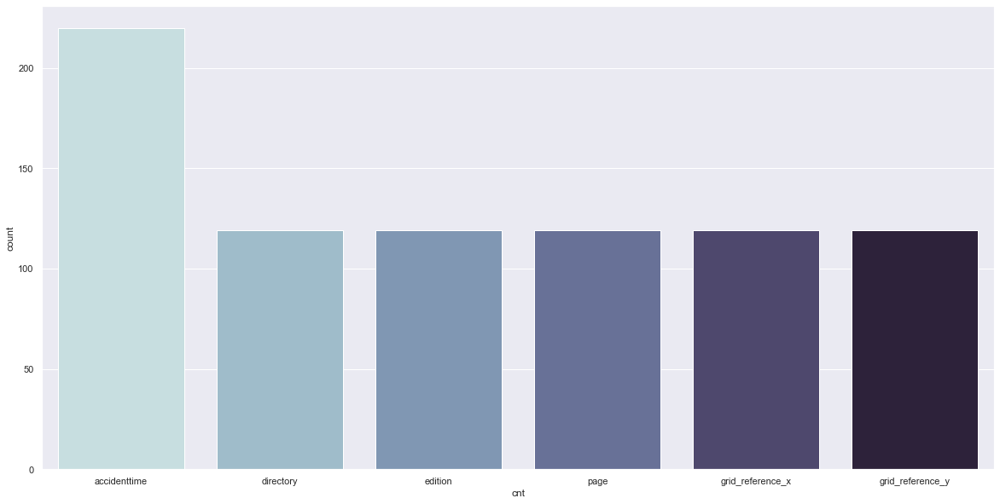

ACCIDENT_CHAINAGE table doesn't have any missing value

The ACCIDENT_EVENT table's missing value plot is: 



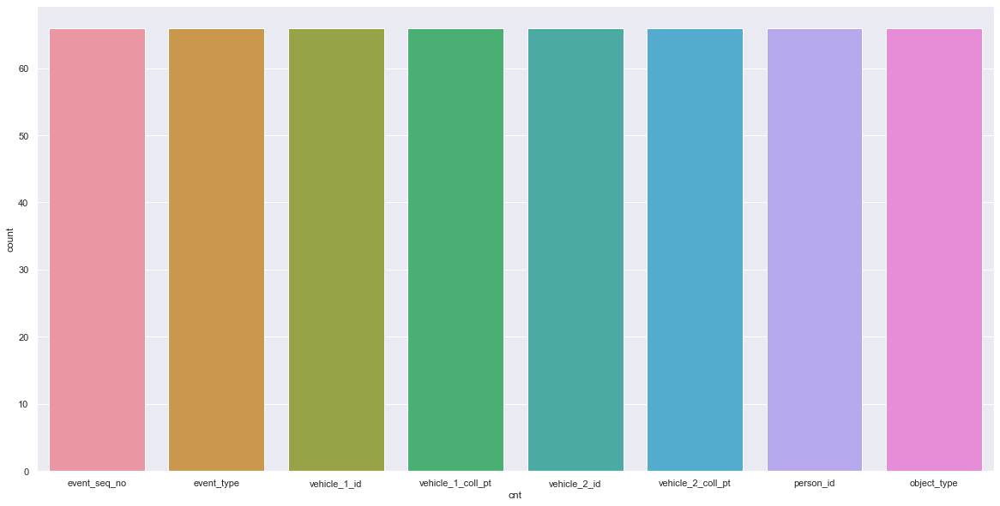

The ACCIDENT_LOCATION table's missing value plot is: 



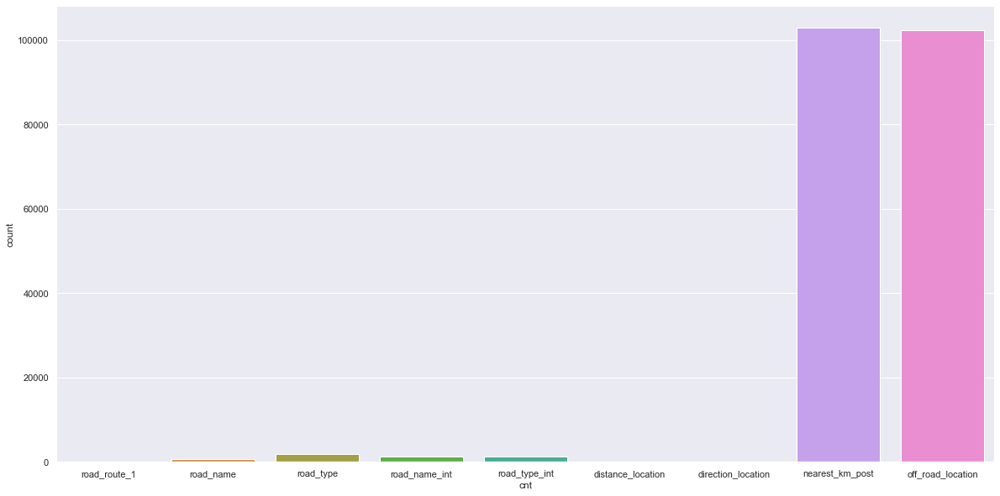

ATMOSPHERIC_COND table doesn't have any missing value

NODE table doesn't have any missing value

NODE_ID_COMPLEX_INT_ID table doesn't have any missing value

The PERSON table's missing value plot is: 



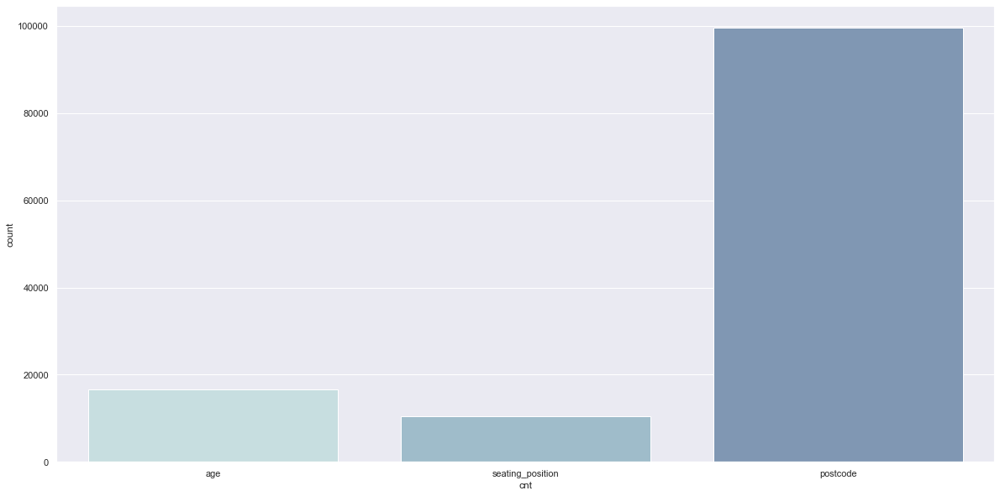

ROAD_SURFACE_COND table doesn't have any missing value

SUBDCA table doesn't have any missing value

The Statistic_Checks table's missing value plot is: 



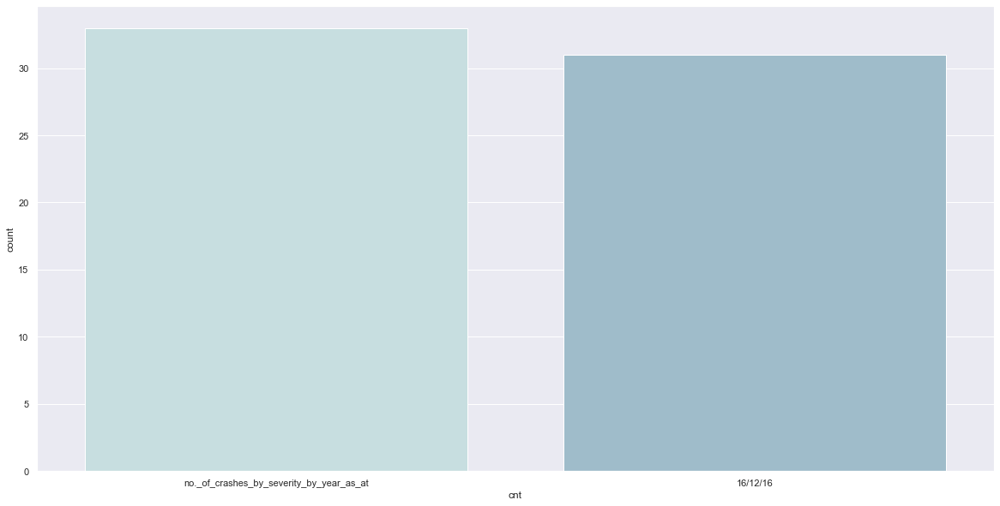

The VEHICLE table's missing value plot is: 



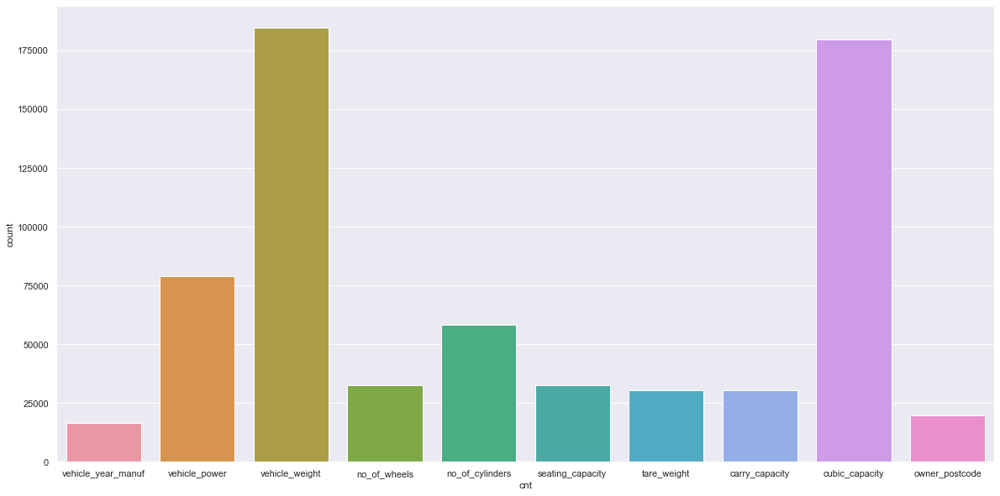

In [101]:
for df_name, df in data_frames.items():
    #if df[df.isnull().sum() > 0]:
    if(df.isnull().sum() > 0).any():
        data = pd.DataFrame({'cnt': list(itertools.chain(*[[row['index']] * row['cnt'] for idx, row in df.isnull().sum().to_frame('cnt').reset_index().iterrows()]))})
        sns.countplot(x = 'cnt', data = data)
        print(blue(f'The {df_name} table\'s missing value plot is: \n'))
        plt.show()
    else:
        print(green(f'{df_name} table doesn\'t have any missing value\n'))

_We could also use heatmap of Null values to see around what values the missing values more if this provide better understanding or road map to find the best way of imputation._

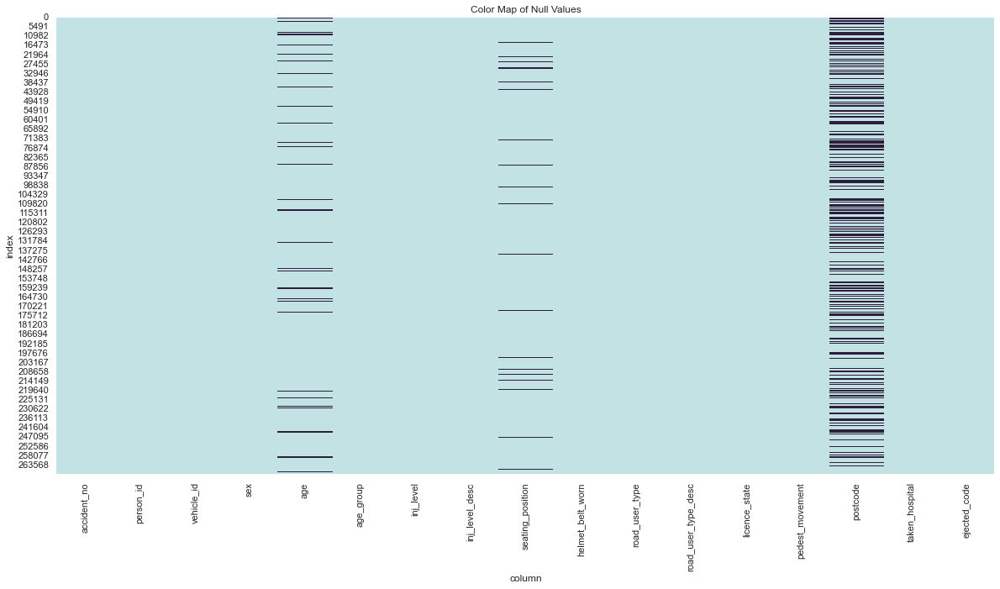

In [13]:
sns.heatmap(data_PERSON.isnull(), cbar=False, cmap=sns.color_palette(PALETTE, as_cmap=True))
plt.ylabel('index')
plt.xlabel('column')
plt.title('Color Map of Null Values')
plt.show()

### Note:

There are 12 tables with different columns. For the data visualization and story telling part, we will select the columns we want to zoom in and see the patterns and relationships. 

As there are too many tables, using SQL can be more effective with less coding.  By creating a database, we can simply ingest the tables and query from there. 

In [14]:
# connect/create a database called test.db
conn = sqlite3.connect("data_base/test.db") 

# store all of the tables in the test.db database:

#for key, value in data_frames.items():
#    value.to_sql(key, conn)

__Let's check if all the tables are ingested into the database!__

In [15]:
cursor = conn.cursor()

cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
print(cursor.fetchall())

[('ACCIDENT',), ('ACCIDENT_CHAINAGE',), ('ACCIDENT_EVENT',), ('ACCIDENT_LOCATION',), ('ATMOSPHERIC_COND',), ('NODE',), ('NODE_ID_COMPLEX_INT_ID',), ('PERSON',), ('ROAD_SURFACE_COND',), ('SUBDCA',), ('Statistic_Checks',), ('VEHICLE',)]


Since we have the coordinates data, it can give lots of insight to see all the accidents on the map of Australia.

By this way we can see the extend of data by the region

In [16]:
sql_string = '''
                SELECT count(accident_no) as total_crash, lat, long, postcode_no
                FROM 
                    NODE
                GROUP BY postcode_no
                                         
             '''
df_coordinates = pd.read_sql(sql_string, conn)

In [17]:
m = folium.Map([-38.043995, 145.264296], zoom_start=7)

for index, row in df_coordinates.iterrows():
    if row['total_crash'] >= 2000:
        marker_color = 'darkred'
        fill_color = 'lightred'
    elif row['total_crash'] >= 1500:
        marker_color = 'darkred'
        fill_color = 'orange'
    elif row['total_crash'] >= 1000:
        marker_color = 'darkred'
        fill_color = 'lightorange'
    elif row['total_crash'] >= 500:
        marker_color = 'darkred'
        fill_color = 'lightred'
    else:
        marker_color='darkred'
        fill_color = 'lightyellow'
        
    folium.Circle(
          location=[row['lat'], row['long']],
          popup= 'Accidents:' +str(row['total_crash']),
          radius=row['total_crash'],
          color=marker_color,
          fill=False,
          fill_color=fill_color,
       ).add_to(m)

In [25]:
m

From the map we see that the number of the accidents increase arounthe city centers. 

Melburn has the highest ratio as it was expected. 

If we zoom in more, we can spot the exact streets and neighboors where more accidents are happening. 

We can also map the filtered data based on hours and accident type to see what kind of accidents are happening in different spots. 

### Data Statistics

_For a start, let's select some of the column to look at their basic statistics and print the pandas profiling report for more advanced statistical report_

In [102]:
sql_select_columns = '''

                SELECT 
                --from ACCIDENT table
                    accidentdate,
                    accidenttime,
                    accident_type,
                    accident_type_desc,
                    day_of_week,
                    day_week_description,
                    light_condition,
                    no_persons,
                    no_persons_killed,
                    road_geometry,
                    road_geometry_desc,
                    severity,
                    speed_zone,
                    
                --from ACCIDENT_EVENT table
                    event_type,
                    event_type_desc,
                    object_type,
                    object_type_desc,
                    
                    
                --from ATMOSPHERIC_COND table
                    atmosph_cond,
                    atmosph_cond_desc,
                    
                    
                --from PERSON table
                    sex,
                    age_group,
                    seating_position,
                    helmet_belt_worn,
                    road_user_type,
                    road_user_type_desc,
                    
                --from ROAD_SURFACE_COND table
                    surface_cond,
                    surface_cond_desc,
                    
                --from VEHICLE table
                    vehicle_year_manuf,
                    road_surface_type,
                    road_surface_type_desc,
                    vehicle_type,
                    vehicle_type_desc
                    
                FROM 
                    ACCIDENT as a
                JOIN 
                    ACCIDENT_EVENT as ae      ON a.accident_no = ae.accident_no
                JOIN
                    ATMOSPHERIC_COND as ac    ON a.accident_no = ac.accident_no
                JOIN
                    PERSON as p               ON a.accident_no = p.accident_no
                JOIN
                    ROAD_SURFACE_COND as rsc  ON a.accident_no = rsc.accident_no
                JOIN 
                    VEHICLE as v              ON a.accident_no = v.accident_no
                    
    
            
             '''
df_coordinates = pd.read_sql(sql_select_columns, conn)

In [103]:
df_selected_columns = pd.read_sql(sql_select_columns, conn)

In [104]:
df_selected_columns.head()

,accidentdate,accidenttime,accident_type,accident_type_desc,day_of_week,day_week_description,light_condition,no_persons,no_persons_killed,road_geometry,road_geometry_desc,severity,speed_zone,event_type,event_type_desc,object_type,object_type_desc,atmosph_cond,atmosph_cond_desc,sex,age_group,seating_position,helmet_belt_worn,road_user_type,road_user_type_desc,surface_cond,surface_cond_desc,vehicle_year_manuf,road_surface_type,road_surface_type_desc,vehicle_type,vehicle_type_desc
0,14/07/2005,09.30.00,4,Collision with a fixed object,5,Thursday,1,3,0,5,Not at intersection,2,50,3,Ran off carriageway,99.0,Not Applicable,1,Clear,F,40-49,D,1,2,Drivers,2,Wet,2003.0,1,Paved,1,Car
1,14/07/2005,09.30.00,4,Collision with a fixed object,5,Thursday,1,3,0,5,Not at intersection,2,50,3,Ran off carriageway,99.0,Not Applicable,1,Clear,F,40-49,D,1,2,Drivers,2,Wet,2005.0,1,Paved,1,Car
2,14/07/2005,09.30.00,4,Collision with a fixed object,5,Thursday,1,3,0,5,Not at intersection,2,50,C,Collision,1.0,Pole (telphone/electricity),1,Clear,F,40-49,D,1,2,Drivers,2,Wet,2003.0,1,Paved,1,Car
3,14/07/2005,09.30.00,4,Collision with a fixed object,5,Thursday,1,3,0,5,Not at intersection,2,50,C,Collision,1.0,Pole (telphone/electricity),1,Clear,F,40-49,D,1,2,Drivers,2,Wet,2005.0,1,Paved,1,Car
4,14/07/2005,09.30.00,4,Collision with a fixed object,5,Thursday,1,3,0,5,Not at intersection,2,50,C,Collision,99.0,Not Applicable,1,Clear,F,40-49,D,1,2,Drivers,2,Wet,2003.0,1,Paved,1,Car


__Basic statistics__

In [42]:
df_selected_columns.describe()

,accident_type,day_of_week,light_condition,no_persons,no_persons_killed,road_geometry,severity,speed_zone,object_type,atmosph_cond,helmet_belt_worn,road_user_type,surface_cond,vehicle_year_manuf,road_surface_type,vehicle_type
count,25003.000000,25003.000000,25003.000000,25003.000000,25003.000000,25003.000000,25003.000000,25003.000000,25003.000000,25003.000000,25003.000000,25003.000000,25003.000000,23368.000000,25003.000000,25003.000000
mean,1.516938,4.299204,1.514258,4.762508,0.023157,3.426709,2.609447,79.566292,91.988961,1.387993,2.596568,2.567412,1.323521,1993.896868,1.175379,4.195537
std,1.330264,1.977117,1.146491,4.389448,0.189897,1.803751,0.526448,88.482317,24.760527,1.432466,3.032565,1.144421,1.173632,55.906884,1.025395,12.429919
min,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,40.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000
25%,1.000000,3.000000,1.000000,3.000000,0.000000,2.000000,2.000000,60.000000,99.000000,1.000000,1.000000,2.000000,1.000000,1990.000000,1.000000,1.000000
50%,1.000000,5.000000,1.000000,4.000000,0.000000,5.000000,3.000000,70.000000,99.000000,1.000000,1.000000,2.000000,1.000000,1997.000000,1.000000,1.000000
75%,1.000000,6.000000,1.000000,6.000000,0.000000,5.000000,3.000000,80.000000,99.000000,1.000000,1.000000,3.000000,1.000000,2001.000000,1.000000,2.000000
max,9.000000,7.000000,9.000000,50.000000,3.000000,9.000000,4.000000,999.000000,99.000000,9.000000,9.000000,9.000000,9.000000,2005.000000,9.000000,99.000000


In [43]:
df_selected_columns.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25003 entries, 0 to 25002
Data columns (total 35 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   accidentdate            25003 non-null  object 
 1   accidenttime            24997 non-null  object 
 2   accident_type           25003 non-null  int64  
 3   accident_type_desc      25003 non-null  object 
 4   day_of_week             25003 non-null  int64  
 5   day_week_description    25003 non-null  object 
 6   light_condition         25003 non-null  int64  
 7   no_persons              25003 non-null  int64  
 8   no_persons_killed       25003 non-null  int64  
 9   road_geometry           25003 non-null  int64  
 10  road_geometry_desc      25003 non-null  object 
 11  severity                25003 non-null  int64  
 12  speed_zone              25003 non-null  int64  
 13  event_type              25003 non-null  object 
 14  event_type_desc         25003 non-null

In [44]:
df_selected_columns['sex'].value_counts()

M    14484
F     9747
U      772
Name: sex, dtype: int64

__Profile Report__

In [47]:
profile_selected_columns = ProfileReport(df_selected_columns, minimal=False, explorative=True)
profile_selected_columns.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

----------

_Let's look at some of the columns closer in boxplot and histogram at the same line_

In [209]:
 def compare_boxplot_hist(df: pd.DataFrame, col: str, xlim_min: int, xlim_max: int, binwidth: int ) -> None:
        
        '''Generates a boxplot and histogram plot of the values in the ``col`` column of the ``df`` dataframe.
        
             Args:
                 df (pd.DataFrame): dataframe to be plotted.
                 col(str): column.
                 xlim_min, xlim_max: the limit of x values to be drawn.
                 binwidth : binwidth parameter for seaborn histogram plot.
                 
        '''
        _, axs = plt.subplots(1, 2,)
        sns.boxplot(x=df[col], ax=axs[0], showmeans=True, showfliers = False)
        axs[0].set_title('Boxplot')
        sns.histplot(df[col], ax=axs[1], kde=False, binwidth=binwidth)
        plt.xlim(xlim_min,xlim_max)
        axs[1].set_title('Histogram')
        plt.suptitle(f'Distribusion of {col}')
        plt.tight_layout()
        plt.show()

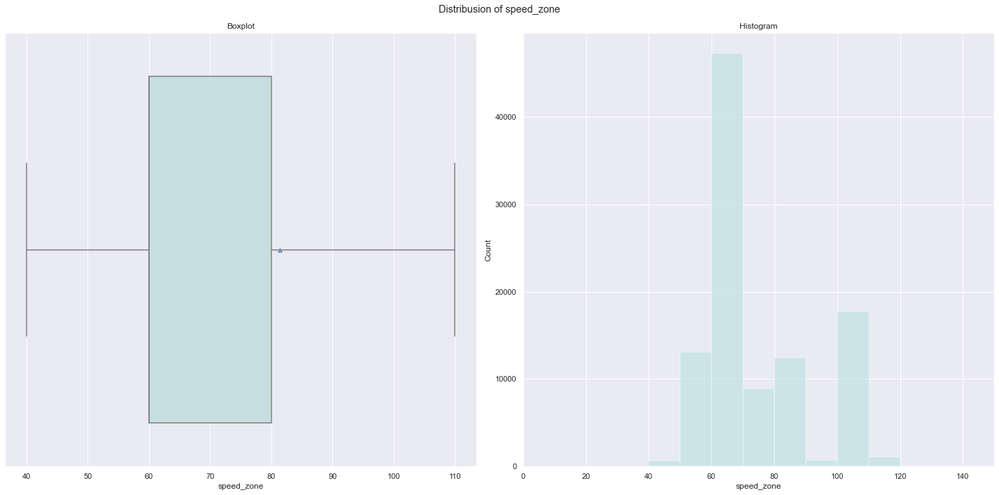

In [22]:
compare_boxplot_hist(data_ACCIDENT, 'speed_zone', 0,150, 10) #df, col, xlim_min, xlim_max, binwidth

__We see that most of the accidents are happening in the road that have speed limit od 60__

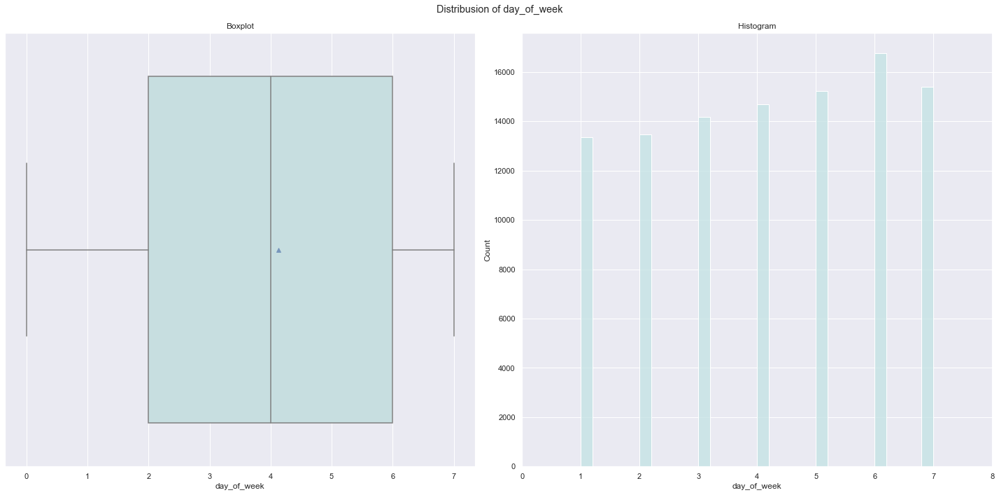

In [23]:
compare_boxplot_hist(data_ACCIDENT, 'day_of_week', 0,8,0.2)  #df, col, xlim_min, xlim_max, binwidth

__The highest number of accident are happened on Friday as day 6 is refered to it.__

From the dataset profile, we can also see the highest frequency is around time 15:30 and 16:00 with %1.4 followed by 17:00 -17:30 with %1.3.

That might be rush hour but for more details we should see the other conditions like weather or road situation that might have effect on accidents. 

For this we can select a sample data including only these hours and zoom in to see how the other variables change. 

In [24]:
ACCIDENT_15_30 = data_ACCIDENT[data_ACCIDENT.accidenttime == '15.30.00']
ACCIDENT_15_30.shape

(1434, 28)

In the first look, it is catching the attention that most of the __'Accident Type Desc'__ are the __'Collision with vehicle'__

<AxesSubplot:>

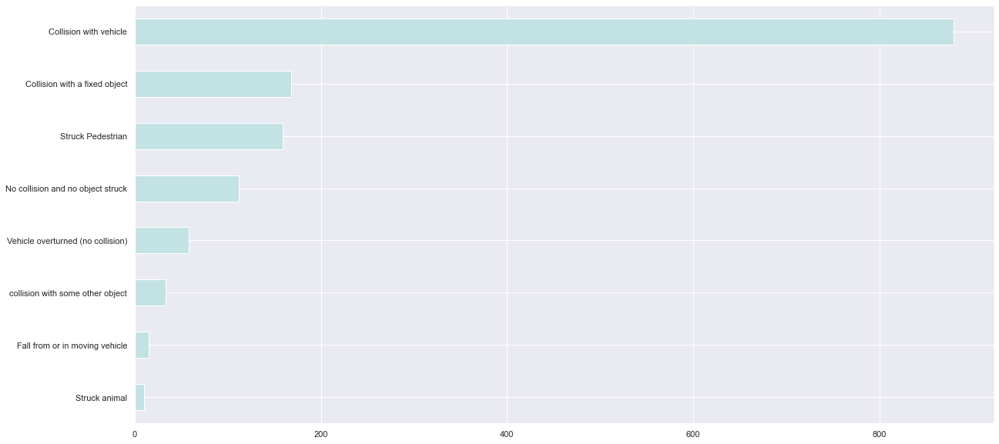

In [27]:
ACCIDENT_15_30['accident_type_desc'].value_counts().sort_values().plot(kind = 'barh')

<AxesSubplot:>

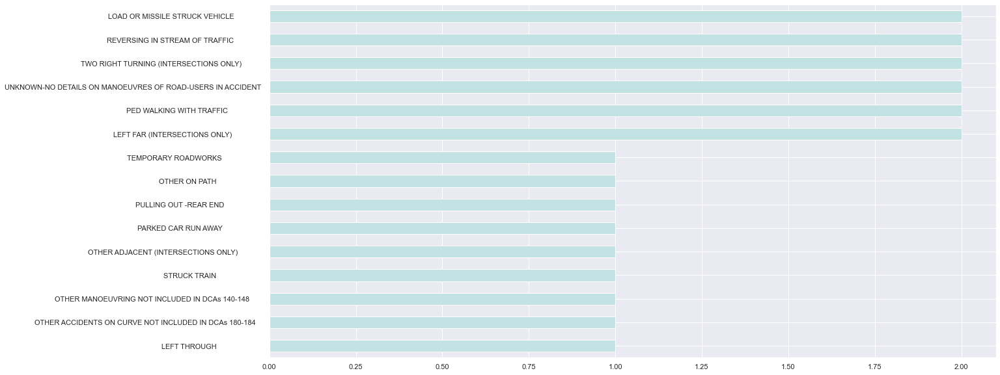

In [29]:
ACCIDENT_15_30['dca_description'].value_counts().sort_values().iloc[:15].plot(kind = 'barh')

In [41]:
ACCIDENT_15_30.loc[ACCIDENT_15_30['dca_code'] == 191].dca_description.iloc[0]

'LOAD OR MISSILE STRUCK VEHICLE               '

Looking at the __'dca_code' = 191__, it is described as:

- LOAD OR MISSILE STRUCK VEHICLE

We can also see it in the dca_code chart provided as PDF with detailed demonstation.

In [42]:
ACCIDENT_15_30['directory'].value_counts()

MEL    1017
VCS     416
Name: directory, dtype: int64

<AxesSubplot:>

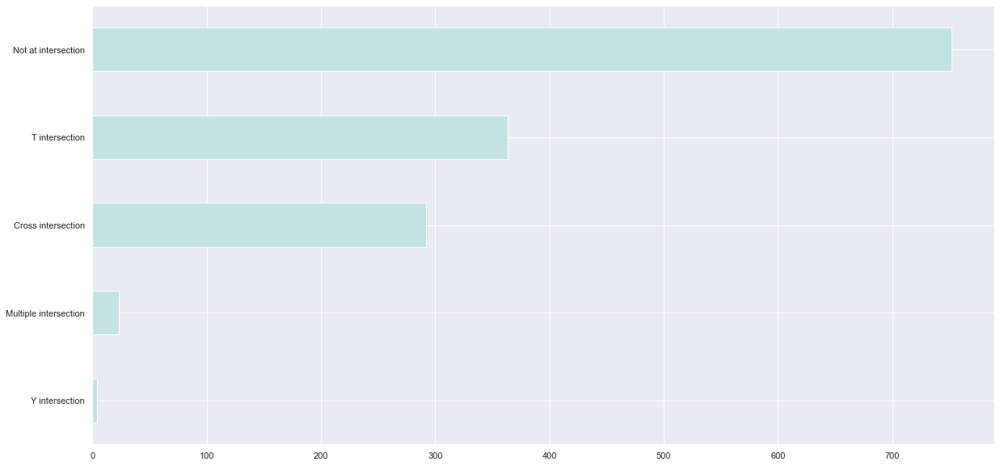

In [21]:
ACCIDENT_15_30['road_geometry_desc'].value_counts().sort_values().plot(kind = 'barh')

### Note:

We see that compared to the Y-intersection roads,

T-intersection roads are more likely to have accidents.

It can be a solution to do a conversion of the T-intersection to the Y-intersection

-----------

__________